We solve:
$$
\min_{\;w\in\Delta^{n-1}}\; f(w)=\tfrac12\,w^\top\Sigma\,w-\lambda\,\mu^\top w,\quad
\Delta^{n-1}=\{w\ge0,\; \mathbf{1}^\top w=1\}.
$$

We enforce the simplex constraint with a softmax reparameterization: $w=\text{softmax}(u)$, and optimize over $u\in\mathbb{R}^n$.


In [225]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display

# rng = np.random.default_rng(42)

# Given: Sigma (PSD, ill-conditioned), mu, lambda 'lam'

def f_w(w, Sigma, mu, lam=1.0):
    return 0.5 * w @ (Sigma @ w) - lam * (mu @ w)

def g_w(w, Sigma, mu, lam=1.0):
    return Sigma @ w - lam * mu   # exact gradient (constant Hessian = Sigma)

def simplex_proj(v):
    """
    Euclidean projection of v onto the probability simplex {w >= 0, 1^T w = 1}.
    Duchi, Shalev-Shwartz, Singer, Chandra (JMLR 2008).
    """
    n = v.size
    u = np.sort(v)[::-1]
    cssv = np.cumsum(u)
    rho = np.nonzero(u*(np.arange(1, n+1)) > (cssv - 1))[0][-1]
    theta = (cssv[rho] - 1.0) / (rho + 1)
    w = np.maximum(v - theta, 0.0)
    return w

def tangent_project(v):
    """Project a vector onto the affine tangent space {d : 1^T d = 0}."""
    return v - v.mean()

In [226]:
def simulate_prices(n_assets=8, n_days=300, dt=1/252, base_vol=0.2, corr_strength=0.99):
    # Build a near-rank-1 correlation matrix for strong dependence
    v = rng.normal(size=n_assets); v /= np.linalg.norm(v)
    C = corr_strength*np.outer(v, v) + (1-corr_strength)*np.eye(n_assets)
    # PSD cleanup
    evals, evecs = np.linalg.eigh(C)
    evals = np.clip(evals, 1e-6, None)
    C = (evecs * evals) @ evecs.T

    mu_true = rng.normal(0.08, 0.02, size=n_assets)  # annualized drift
    vols = base_vol * rng.uniform(0.6, 1.4, size=n_assets)
    L = np.linalg.cholesky(C)

    prices = np.zeros((n_days, n_assets))
    prices[0] = 100.0 * (1 + 0.02*rng.uniform(-1,1,size=n_assets))
    for t in range(1, n_days):
        z = rng.normal(size=n_assets)
        dz = L @ z
        r = (mu_true - 0.5*vols**2)*dt + vols*np.sqrt(dt)*dz
        prices[t] = prices[t-1]*np.exp(r)
    return prices

prices = simulate_prices()
rets = np.diff(np.log(prices), axis=0)
mu = rets.mean(axis=0) * 252.0               # annualized mean
Sigma = np.cov(rets.T) * 252.0               # annualized cov

# Make Σ very ill-conditioned by adding a spiky direction
# u_spike = rng.normal(size=Sigma.shape[0]); u_spike /= np.linalg.norm(u_spike) + 1e-12
# Sigma += 1.0 * np.outer(u_spike, u_spike)
# Sigma += 1e-8*np.eye(Sigma.shape[0])         # small ridge

n = len(mu)
print("n_assets =", n)
print("cond(Sigma) ~", np.linalg.cond(Sigma))

n_assets = 8
cond(Sigma) ~ 405.02235177525205


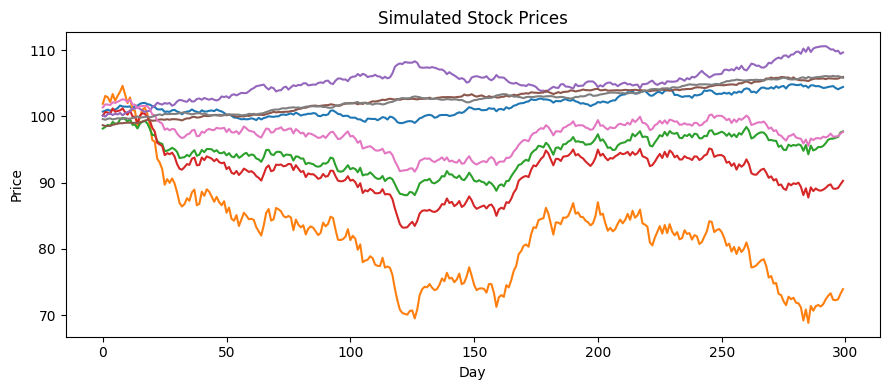

In [227]:
plt.figure(figsize=(9,4))
plt.plot(prices)
plt.xlabel("Day"); plt.ylabel("Price")
plt.title("Simulated Stock Prices")
plt.tight_layout(); plt.show()

In [228]:
# ---- Frank–Wolfe (conditional gradient) utility on the simplex ----

def fw_direction(w, g):
    """
    For simplex: s = e_{argmin_i g_i}, d = s - w.
    """
    i = np.argmin(g)
    s = np.zeros_like(w); s[i] = 1.0
    d = s - w
    return d, i

def fw_exact_linesearch(w, d, Sigma, mu, lam=1.0):
    """
    Exact gamma in [0,1] minimizing f(w + gamma d) for quadratic f.
    f'(gamma) = (w + gamma d)^T (Sigma d) - lam (mu^T d)
    -> set to 0 => gamma* = (lam*mu^T d - w^T Sigma d) / (d^T Sigma d)
    """
    Sd = Sigma @ d
    denom = d @ Sd
    if denom <= 1e-20:
        return 1.0  # degenerate; just take full FW step
    numer = lam*(mu @ d) - (w @ Sd)
    gamma = np.clip(numer/denom, 0.0, 1.0)
    return float(gamma)

def fw_step(w, g, Sigma, mu, lam=1.0):
    d, i = fw_direction(w, g)
    gamma = fw_exact_linesearch(w, d, Sigma, mu, lam)
    w_new = w + gamma*d
    return w_new, gamma, i

# ---- small helpers ----

def sufficient_decrease(f_new, f_old, c=1e-12):
    return (f_old - f_new) > c

def too_small_move(w_new, w_old, tol=1e-12):
    return np.linalg.norm(w_new - w_old, ord=1) < tol

Objective on the Simplex via Softmax

Let w=\text{softmax}(u). Then:
f(w) = \tfrac12 w^\top \Sigma w - \lambda \mu^\top w,\qquad
\nabla_w f = \Sigma w - \lambda \mu.
The Jacobian J=\frac{\partial w}{\partial u}=\mathrm{diag}(w)-ww^\top. Gradient in u-space is J^\top \nabla_w f.

In [229]:
def armijo_projected_gradient(w, Sigma, mu, lam=1.0, alpha0=1.0, c1=1e-4, tau=0.5, max_iter=30):
    """
    Armijo backtracking for *proximal gradient* on the simplex:
        w_trial = Proj_simplex(w - alpha * g)
    Returns (w_trial, f_trial, g_trial, alpha_used).
    """
    f0 = f_w(w, Sigma, mu, lam)
    g0 = g_w(w, Sigma, mu, lam)
    g0_norm2 = np.dot(g0, g0)
    if g0_norm2 < 1e-30:
        return w, f0, g0, 0.0

    alpha = alpha0
    for _ in range(max_iter):
        w_trial = simplex_proj(w - alpha * g0)
        f_trial = f_w(w_trial, Sigma, mu, lam)
        # Armijo condition with reference to w - alpha g (standard for projected-GD):
        if f_trial <= f0 - c1*alpha*g0_norm2:
            return w_trial, f_trial, g_w(w_trial, Sigma, mu, lam), alpha
        alpha *= tau

    # last resort
    w_trial = simplex_proj(w - alpha * g0)
    return w_trial, f_w(w_trial, Sigma, mu, lam), g_w(w_trial, Sigma, mu, lam), alpha

In [230]:
def optimize_pgd(w0, Sigma, mu, lam=1.0, iters=200, alpha0=1.0):
    w = simplex_proj(w0)
    traj = [w.copy()]
    vals = [f_w(w, Sigma, mu, lam)]
    for _ in range(iters):
        # Try projected gradient Armijo
        w_trial, f_trial, g_trial, a_used = armijo_projected_gradient(
            w, Sigma, mu, lam, alpha0=alpha0
        )
        # If stalled, fall back to Frank–Wolfe
        if too_small_move(w_trial, w) or not sufficient_decrease(f_trial, vals[-1]):
            g = g_w(w, Sigma, mu, lam)
            w_trial, gamma, _ = fw_step(w, g, Sigma, mu, lam)
            f_trial = f_w(w_trial, Sigma, mu, lam)

        w = w_trial
        traj.append(w.copy()); vals.append(f_trial)
    return np.array(traj), np.array(vals)

In [231]:
def tangent_project(v):
    # project onto sum(v)=0 subspace
    return v - v.mean()

def armijo_proj_linesearch_directional(w, d, Sigma, mu, lam=1.0, alpha0=1.0, c1=1e-4, tau=0.5, max_iter=30):
    """
    Use direction d (sum(d)=0 suggested). Each trial is projected to simplex:
        w_trial = Proj_simplex(w + alpha d)
    Armijo decrease checked against directional derivative g^T d.
    """
    g0 = g_w(w, Sigma, mu, lam)
    d = tangent_project(d)  # ensure sum(d)=0
    g0d = np.dot(g0, d)
    if g0d >= 0:
        d = -tangent_project(g0)
        g0d = np.dot(g0, d)
        if abs(g0d) < 1e-30:
            return w, f_w(w,Sigma,mu,lam), g0, 0.0

    f0 = f_w(w, Sigma, mu, lam)
    alpha = alpha0
    for _ in range(max_iter):
        w_trial = simplex_proj(w + alpha * d)
        f_trial = f_w(w_trial, Sigma, mu, lam)
        if f_trial <= f0 + c1*alpha*g0d:
            return w_trial, f_trial, g_w(w_trial, Sigma, mu, lam), alpha
        alpha *= tau
    w_trial = simplex_proj(w + alpha * d)
    return w_trial, f_w(w_trial, Sigma, mu, lam), g_w(w_trial, Sigma, mu, lam), alpha

def optimize_pcg(w0, Sigma, mu, lam=1.0, iters=200, alpha0=1.0):
    w = simplex_proj(w0)
    traj = [w.copy()]
    vals = [f_w(w, Sigma, mu, lam)]
    g_prev = g_w(w, Sigma, mu, lam)
    g_prev_t = tangent_project(g_prev)
    d = -g_prev_t

    for t in range(iters):
        w_trial, f_trial, g_new, a_used = armijo_proj_linesearch_directional(
            w, d, Sigma, mu, lam, alpha0=alpha0
        )

        # Fallback to Frank–Wolfe if stalled
        if too_small_move(w_trial, w) or not sufficient_decrease(f_trial, vals[-1]):
            g = g_w(w, Sigma, mu, lam)
            w_trial, gamma, _ = fw_step(w, g, Sigma, mu, lam)
            f_trial = f_w(w_trial, Sigma, mu, lam)
            g_new = g_w(w_trial, Sigma, mu, lam)
            # restart direction from new gradient
            g_prev_t = tangent_project(g_new)
            d = -g_prev_t
            w = w_trial
            traj.append(w.copy()); vals.append(f_trial)
            continue

        # PR+ update in tangent space
        g_new_t = tangent_project(g_new)
        yk = g_new_t - g_prev_t
        beta_pr = np.dot(g_new_t, yk) / max(np.dot(g_prev_t, g_prev_t), 1e-30)
        beta = max(beta_pr, 0.0)

        # Restart criteria
        if f_trial > vals[-1] - 1e-14 or np.dot(g_new_t, d) >= 0 or (t+1) % 10 == 0:
            d = -g_new_t
        else:
            d = -g_new_t + beta * d

        w = w_trial
        g_prev_t = g_new_t
        traj.append(w.copy()); vals.append(f_trial)

    return np.array(traj), np.array(vals)

In [232]:
# ---------- Projected L-BFGS (stable with changing free set) ----------

def free_mask(w, g, eps=1e-14):
    """
    Boolean mask of FREE variables (True = free) using a simple active-set rule:
      - If w_i == 0 and gradient points further downwards (g_i > 0), keep it ACTIVE (False).
      - Otherwise mark FREE (True).
    """
    A = (w <= eps) & (g > 0.0)  # active-at-lower-bound & would like to go more negative
    F = ~A
    return F  # boolean mask length n


def project_tangent_on_free(v, Fmask):
    """
    Project v onto the affine tangent of the simplex **restricted to the free set**:
      - Keep only free coordinates.
      - Make their sum zero by subtracting mean over FREE coordinates.
      - Active coords set to 0.
    The output is full-length (n), with zeros on active coords and sum(v)=0 overall.
    """
    v_proj = np.zeros_like(v)
    if np.any(Fmask):
        vf = v[Fmask]
        vf = vf - vf.mean()  # zero-sum over free coords  -> also zero-sum overall since active are 0
        v_proj[Fmask] = vf
    return v_proj


class LBFGSFull:
    """
    L-BFGS that always stores full-length s,y (length n), but we **pre-project**
    them to the current free-set tangent subspace at the time they are created.
    This way, all history vectors share the same dimension n (zeros on active coords),
    so two-loop recursion never sees shape mismatches.
    """
    def __init__(self, m=10):
        self.m = m
        self.S = []  # list of full-length s_k (already projected to tangent on that step's free set)
        self.Y = []  # list of full-length y_k (same)
        self.rho = []

    def reset(self):
        self.S.clear(); self.Y.clear(); self.rho.clear()

    def two_loop(self, g):
        if not self.S:
            return -g.copy()

        q = g.copy()
        alphas = []
        # First loop (backward)
        for s, y, rho in zip(reversed(self.S), reversed(self.Y), reversed(self.rho)):
            a = rho * np.dot(s, q)
            alphas.append(a)
            q = q - a*y

        # Initial scaling gamma = (s^T y)/(y^T y) from most-recent pair
        ys = np.dot(self.Y[-1], self.S[-1])
        yy = np.dot(self.Y[-1], self.Y[-1])
        gamma = ys/yy if yy > 1e-30 else 1.0
        r = gamma*q

        # Second loop (forward)
        for (s, y, rho), a in zip(zip(self.S, self.Y, self.rho), reversed(alphas)):
            b = rho * np.dot(y, r)
            r = r + s*(a - b)
        return -r

    def update(self, s_full, y_full):
        """
        s_full, y_full are already projected to the tangent on the **previous step's** free set.
        Apply standard curvature checks and append as full-length vectors.
        """
        ys = np.dot(y_full, s_full)
        if ys <= 1e-12 or ys <= 1e-6*np.linalg.norm(s_full)*np.linalg.norm(y_full):
            return False
        rho_k = 1.0/ys
        self.S.append(s_full); self.Y.append(y_full); self.rho.append(rho_k)
        if len(self.S) > self.m:
            self.S.pop(0); self.Y.pop(0); self.rho.pop(0)
        return True


def optimize_plbfgs(w0, Sigma, mu, lam=1.0, iters=200, m=10, alpha0=1.0):
    """
    Projected L-BFGS on the simplex:
      - Build descent direction in the **free-set tangent** (sum-zero on free coords; zeros on active).
      - Line-search with projection back to the simplex (Armijo, monotone).
      - s,y pairs are stored as full-length n-vectors with zeros on active coords, so history has stable shape.
    """
    w = simplex_proj(w0)
    g = g_w(w, Sigma, mu, lam)

    traj = [w.copy()]
    vals = [f_w(w, Sigma, mu, lam)]
    lb = LBFGSFull(m=m)

    for _ in range(iters):
        # Current free mask & tangent-projected gradient
        Fmask = free_mask(w, g)
        g_free_tan = project_tangent_on_free(g, Fmask)

        # Build L-BFGS direction in full space, then enforce free-set tangent again (safety)
        if lb.S:
            d = lb.two_loop(g_free_tan)
        else:
            d = -g_free_tan
        d = project_tangent_on_free(d, Fmask)  # ensure feasibility (sum-zero on free; zeros on active)

        # Armijo line search with projection to simplex
        w_new, f_new, g_new = armijo_proj_backtracking(f_w, g_w, w, d, Sigma, mu, lam, alpha0=alpha0)

        # Create curvature pair **in the subspace used to compute d** (i.e., previous Fmask)
        s = w_new - w
        y = g_new - g
        s_full = project_tangent_on_free(s, Fmask)
        y_full = project_tangent_on_free(y, Fmask)

        # Update memory (skips if curvature is poor)
        ok = lb.update(s_full, y_full)
        if not ok:
            lb.reset()  # avoid poisoning the memory

        # Next iterate
        w, g = w_new, g_new
        traj.append(w.copy()); vals.append(f_new)

    return np.array(traj), np.array(vals)

In [233]:
# ---------- Improved Projected Trust-Region on the Simplex ----------
# Works in the tangent space (sum(p)=0), enforces nonnegativity by truncating
# the step length (no post projection), and uses a standard TR ratio test.

def _P_matrix(n):
    # Orthogonal projector onto tangent: P = I - (11^T)/n
    J = np.ones((n, n))/n
    return np.eye(n) - J

def _Hv_tangent(Sigma, v, P):
    # H_tan v := P (Sigma (P v)), guarantees result is tangent (sum=0)
    return P @ (Sigma @ (P @ v))

def _steihaug_tr_cg_tangent(g, Sigma, Delta, P, max_cg=200, tol=1e-10):
    """
    Steihaug-CG in the tangent space (sum(p)=0).
    Returns a step p with ||p|| <= Delta and sum(p)=0.
    """
    # Work entirely in tangent space
    r = -g.copy()                  # since we solve H p = -g
    r = P @ r                      # ensure tangent
    if np.linalg.norm(r) < tol:
        return np.zeros_like(g)
    d = r.copy()
    p = np.zeros_like(g)
    rr = np.dot(r, r)

    for _ in range(max_cg):
        Hd = _Hv_tangent(Sigma, d, P)
        dHd = np.dot(d, Hd)

        if dHd <= 0:  # negative curvature -> go to boundary
            # find tau s.t. ||p + tau d|| = Delta
            a = np.dot(d, d)
            b = 2*np.dot(p, d)
            c = np.dot(p, p) - Delta**2
            disc = max(b*b - 4*a*c, 0.0)
            tau = (-b + np.sqrt(disc)) / (2*a)
            return p + tau*d

        alpha = rr / dHd
        p_next = p + alpha*d
        if np.linalg.norm(p_next) >= Delta:
            a = np.dot(d, d)
            b = 2*np.dot(p, d)
            c = np.dot(p, p) - Delta**2
            disc = max(b*b - 4*a*c, 0.0)
            tau = (-b + np.sqrt(disc)) / (2*a)
            return p + tau*d

        r_next = r - alpha*Hd
        rr_next = np.dot(r_next, r_next)
        if np.sqrt(rr_next) < tol:
            return p_next
        beta = rr_next / max(rr, 1e-30)
        d = r_next + beta*d
        p, r, rr = p_next, r_next, rr_next

    return p  # truncated by max_cg

def _alpha_max_feasible(w, p):
    """
    Largest alpha in [0, +inf) such that w + alpha p >= 0 elementwise.
    If p_i < 0, constraint is alpha <= -w_i/p_i. Else no constraint from i.
    """
    mask = p < 0
    if not np.any(mask):
        return np.inf
    return float(np.min(-w[mask] / p[mask]))

def optimize_ptr(w0, Sigma, mu, lam=1.0, iters=200, Delta0=0.5, eta=1e-8, Delta_max=10.0):
    """
    Trust-region with a tangent-space model:
        m(p) = f(w) + g^T p + 0.5 p^T (P Σ P) p,    sum(p)=0, ||p|| <= Δ
    Step feasibility: choose alpha <= min(1, alpha_feas) to keep w+alpha p >= 0.
    No projection after stepping; accept/reject by standard ratio test.
    Fallback to Frank–Wolfe if the TR step becomes too small or not improving.
    """
    n = w0.size
    P = _P_matrix(n)
    w = simplex_proj(w0)
    traj = [w.copy()]
    vals = [f_w(w, Sigma, mu, lam)]
    Delta = float(Delta0)

    for _ in range(iters):
        g = g_w(w, Sigma, mu, lam)
        # Build TR step in tangent space
        p_tr = _steihaug_tr_cg_tangent(g, Sigma, Delta, P, max_cg=200, tol=1e-10)
        if np.linalg.norm(p_tr) < 1e-14:
            # fallback to FW if TR step is negligible
            w_fw, gamma, _ = fw_step(w, g, Sigma, mu, lam)
            f_fw = f_w(w_fw, Sigma, mu, lam)
            if f_fw < vals[-1] - 1e-12:
                w = w_fw
                traj.append(w.copy()); vals.append(f_fw)
                continue
            else:
                # already optimal
                traj.append(w.copy()); vals.append(vals[-1])
                break

        # truncate by feasibility (nonnegativity) WITHOUT projection
        alpha_feas = _alpha_max_feasible(w, p_tr)
        alpha = min(1.0, alpha_feas)
        p = alpha * p_tr

        # Predicted reduction using the local quadratic model (on p)
        g_tan = P @ g
        Hp = _Hv_tangent(Sigma, p, P)
        pred = - (np.dot(g_tan, p) + 0.5*np.dot(p, Hp))  # m(0)-m(p)

        # Actual reduction
        f0 = vals[-1]
        w_trial = w + p
        # Numerical safety: tiny negative due to rounding -> clamp to 0 and renormalize
        neg_mask = w_trial < 0
        if np.any(neg_mask):
            w_trial = np.maximum(w_trial, 0.0)
            w_trial = w_trial / max(w_trial.sum(), 1e-30)
        f_trial = f_w(w_trial, Sigma, mu, lam)
        ared = f0 - f_trial

        # Ratio test
        if pred <= 0:
            rho = -np.inf  # model is not predictive; force shrink
        else:
            rho = ared / pred

        # Update trust-region radius
        if rho < 0.25:
            Delta = max(0.25*Delta, 1e-12)
        elif rho > 0.75 and abs(np.linalg.norm(p_tr) - Delta) < 1e-10:
            Delta = min(2.0*Delta, Delta_max)

        # Accept / reject
        if rho > eta and ared > 1e-14:
            w = w_trial
            traj.append(w.copy()); vals.append(f_trial)
        else:
            # Reject -> optional FW fallback to ensure progress
            w_fw, gamma, _ = fw_step(w, g, Sigma, mu, lam)
            f_fw = f_w(w_fw, Sigma, mu, lam)
            if f_fw < f0 - 1e-12:
                w = w_fw
                traj.append(w.copy()); vals.append(f_fw)
            else:
                # No significant progress; keep current
                traj.append(w.copy()); vals.append(f0)

    return np.array(traj), np.array(vals)

In [234]:
# Feasible start
n = Sigma.shape[0]
w0 = simplex_proj(np.ones(n)/n + 0.05*np.random.default_rng(0).normal(size=n))

lam = 3.0
iters = 150

traj_pgd, vals_pgd = optimize_pgd(w0, Sigma, mu, lam=lam, iters=iters, alpha0=1.0)
traj_pcg, vals_pcg = optimize_pcg(w0, Sigma, mu, lam=lam, iters=iters, alpha0=1.0)
traj_plb, vals_plb = optimize_plbfgs(w0, Sigma, mu, lam=lam, iters=iters, m=10, alpha0=1.0)
traj_ptr, vals_ptr = optimize_ptr(w0, Sigma, mu, lam=lam, iters=iters, Delta0=0.5)

print("Final f:")
print("  PGD    :", vals_pgd[-1])
print("  PCG    :", vals_pcg[-1])
print("  P-LBFGS:", vals_plb[-1])
print("  PTR    :", vals_ptr[-1])

Final f:
  PGD    : -0.2283757976136652
  PCG    : -0.2283757976136652
  P-LBFGS: -0.2283757976136652
  PTR    : -0.2283757976136652


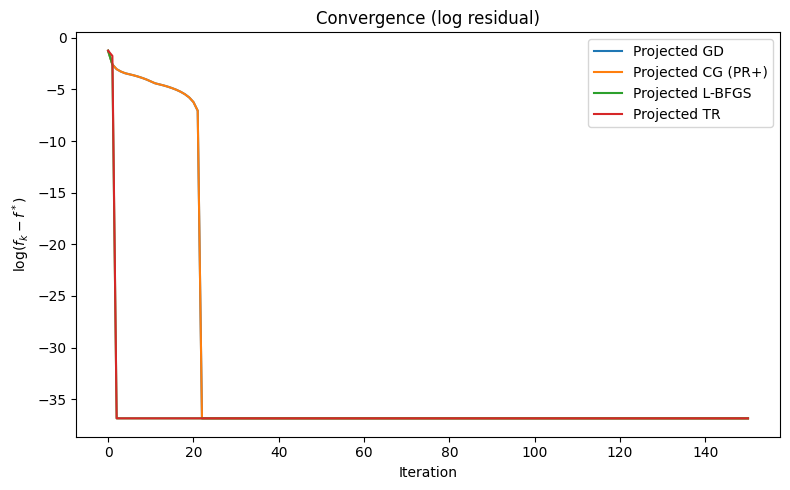

In [235]:
# After you compute all trajectories/values:
# traj_pgd, vals_pgd, traj_pcg, vals_pcg, traj_plb, vals_plb, traj_ptr, vals_ptr

# choose best final value as f*
f_star = min(vals_pgd[-1], vals_pcg[-1], vals_plb[-1], vals_ptr[-1])

def plot_log_convergence(curves, labels, f_star, eps=1e-16, title="Convergence (log residual)"):
    plt.figure(figsize=(8,5))
    for v, lbl in zip(curves, labels):
        res = np.maximum(v - f_star, eps)
        plt.plot(np.log(res), label=lbl)
    plt.xlabel("Iteration")
    plt.ylabel(r"$\log(f_k - f^*)$")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_log_convergence(
    [vals_pgd, vals_pcg, vals_plb, vals_ptr],
    ["Projected GD", "Projected CG (PR+)", "Projected L-BFGS", "Projected TR"],
    f_star
)

In [236]:
def animate_weights(W, title, labels=None):
    m = W.shape[1]
    if labels is None:
        labels = [f"A{i+1}" for i in range(m)]
    fig, ax = plt.subplots(figsize=(8,4.5))
    bars = ax.bar(np.arange(m), W[0], tick_label=labels)
    ax.set_ylim(0, 1.0)
    ax.set_ylabel("Weight")
    ax.set_title(title)

    def update(k):
        wk = W[k]
        for i, b in enumerate(bars):
            b.set_height(wk[i])
        return bars

    anim = animation.FuncAnimation(fig, update, frames=W.shape[0], interval=80, blit=False)
    display(HTML(anim.to_jshtml()))
    plt.close(fig)

labels = [f"A{i+1}" for i in range(n)]
W_pgd = traj_pgd
W_pcg = traj_pcg
W_plb = traj_plb
W_ptr = traj_ptr

animate_weights(W_pgd, "Projected GD: Weight Trajectory", labels)
animate_weights(W_pcg, "Projected CG (PR+): Weight Trajectory", labels)
animate_weights(W_plb, "Projected L-BFGS (Free-Set): Weight Trajectory", labels)
animate_weights(W_ptr, "Projected TR (Tangent Newton): Weight Trajectory", labels)